In [3]:
import pandas as pd

# # Load the datasets
# train_file_path = 'crisismmd_datasplit_all/crisismmd_datasplit_all/task_informative_text_img_train.tsv'
# dev_file_path = 'crisismmd_datasplit_all/crisismmd_datasplit_all/task_informative_text_img_dev.tsv'
test_file_path = 'crisismmd_datasplit_all/crisismmd_datasplit_all/task_informative_text_img_test.tsv'

# Load TSV files into DataFrames
# train_data = pd.read_csv(train_file_path, sep='\t')
# dev_data = pd.read_csv(dev_file_path, sep='\t')
test_data = pd.read_csv(test_file_path, sep='\t')

# Display the first few rows of each dataset
test_data.head()


,event_name,tweet_id,image_id,tweet_text,image,label,label_text,label_image,label_text_image
0,srilanka_floods,878185882431389696,878185882431389696_0,Cristofer CLEMENTE MORA now in 2nd at aguille ...,data_image/srilanka_floods/23_6_2017/878185882...,not_informative,not_informative,not_informative,Positive
1,hurricane_harvey,906258753707790336,906258753707790336_0,RT @THS_College: On our way to Warrior Restora...,data_image/hurricane_harvey/8_9_2017/906258753...,not_informative,informative,not_informative,Negative
2,hurricane_maria,910542719864397824,910542719864397824_0,Hurricane Maria batters Puerto Rico as a Cat 4...,data_image/hurricane_maria/20_9_2017/910542719...,informative,informative,informative,Positive
3,hurricane_harvey,906219963152785408,906219963152785408_0,ZZ Top Donating ‘La Grange’ Download Sales To ...,data_image/hurricane_harvey/8_9_2017/906219963...,informative,informative,not_informative,Negative
4,hurricane_maria,913009824195104768,913009824195104768_0,8am #Maria update: holding steady as a strong ...,data_image/hurricane_maria/27_9_2017/913009824...,informative,informative,informative,Positive


c:\Users\Aman\AppData\Local\Programs\Python\Python311\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Model loaded from D:\BTP_2\CrisisMMD_v2.0\model\Model_CLIP\model.pt


Testing: 100%|██████████| 50/50 [00:21<00:00,  2.38it/s]


Test Accuracy on Positive Samples: 92.69%


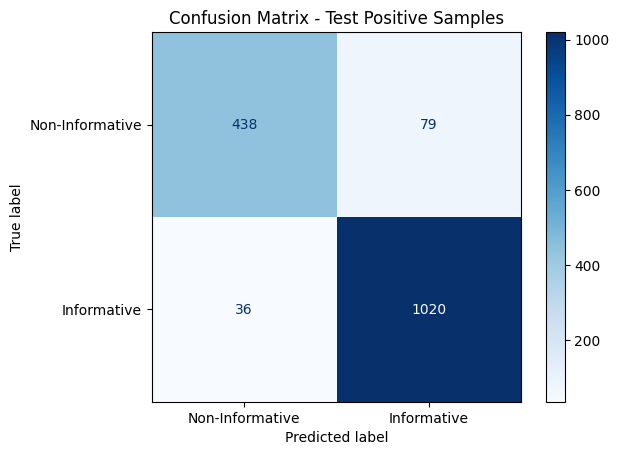

False Negatives:
                                          image_path  \
0  data_image/hurricane_irma/19_9_2017/9102165764...   
1  data_image/mexico_earthquake/3_10_2017/9152185...   
2  data_image/mexico_earthquake/29_9_2017/9138159...   
3  data_image/hurricane_irma/17_9_2017/9094371725...   
4  data_image/hurricane_irma/17_9_2017/9093835301...   

                                          tweet_text  
0  Testing a podium mic for mayor press conferenc...  
1  A spot of sunshine in these very dark times by...  
2  Punk/hc benefit show for Mexico City earthquak...  
3  CITY OFFICIALS: Sunday's conference call is at...  
4  Thanks to my @FEMA app and EAS alerts, I now k...  
False negatives saved to false_negatives.csv


In [1]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, Dataset
from transformers import CLIPProcessor, CLIPModel
import pandas as pd
from PIL import Image
from tqdm import tqdm
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Modify the dataset to optionally return extra info (e.g. image path and tweet text)
class MultimodalDataset(Dataset):
    def __init__(self, dataframe, image_dir, processor, max_length=77, return_info=False):
        self.data = dataframe
        self.image_dir = image_dir
        self.processor = processor
        self.max_length = max_length
        self.return_info = return_info

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        text = self.data.iloc[idx]['tweet_text']
        image_file = self.data.iloc[idx]['image']
        image_path = self.image_dir + image_file
        label = 1 if self.data.iloc[idx]['label'] == 'informative' else 0

        image = Image.open(image_path).convert("RGB")
        inputs = self.processor(
            text=text,
            images=image,
            return_tensors="pt",
            padding="max_length",
            truncation=True,
            max_length=self.max_length
        )
        if self.return_info:
            extra_info = {"image_path": image_path, "tweet_text": text}
            return inputs, torch.tensor(label), extra_info
        return inputs, torch.tensor(label)

# Define the multimodal classifier (same as in training)
class MultimodalClassifier(nn.Module):
    def __init__(self, clip_model):
        super(MultimodalClassifier, self).__init__()
        self.clip_model = clip_model
        self.classifier = nn.Sequential(
            nn.Linear(clip_model.config.projection_dim * 2, 512),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(512, 1)
        )

    def forward(self, inputs):
        text_embeddings = self.clip_model.get_text_features(inputs['input_ids'].squeeze(1))
        image_embeddings = self.clip_model.get_image_features(inputs['pixel_values'])
        combined_embeddings = torch.cat((text_embeddings, image_embeddings), dim=-1)
        output = self.classifier(combined_embeddings)
        return output

# Load the processor and CLIP model
processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")
clip_model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")

# Initialize the model and load the saved state dictionary
model = MultimodalClassifier(clip_model)
model_save_path = r"D:\BTP_2\CrisisMMD_v2.0\model\Model_CLIP\model.pt"
model.load_state_dict(torch.load(model_save_path, map_location=torch.device("cuda" if torch.cuda.is_available() else "cpu")))
print(f"Model loaded from {model_save_path}")

# Prepare the test dataset (assuming the test/validation file is the same as before)
test_df = pd.read_csv('crisismmd_datasplit_all/crisismmd_datasplit_all/task_informative_text_img_dev.tsv', sep='\t')
# Filter for positive samples (label_text_image == "Positive")
test_df_positive = test_df[test_df['label_text_image'] == 'Positive']

# Specify image directory (adjust if needed)
image_dir = ""  # Replace with the correct path if necessary

# Create the dataset and dataloader with extra info enabled
test_dataset = MultimodalDataset(test_df_positive, image_dir, processor, return_info=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

# Evaluation on the test set
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
model.eval()

all_labels = []
all_predictions = []
false_negatives = []  # list to store false negative samples' info

with torch.no_grad():
    for batch in tqdm(test_loader, desc="Testing"):
        # Since we enabled return_info, each batch returns (inputs, labels, info)
        inputs, labels, info = batch

        # Adjust inputs dimensions and send to device
        inputs = {key: value.squeeze(1).to(device) for key, value in inputs.items()}
        labels = labels.to(device)

        outputs = model(inputs)
        preds = (torch.sigmoid(outputs.squeeze(1)) > 0.5).long()

        # Extend global lists for overall accuracy calculation
        all_labels.extend(labels.cpu().numpy())
        all_predictions.extend(preds.cpu().numpy())

        # Check for false negatives (ground truth positive but predicted negative)
        for i in range(len(labels)):
            if labels[i].item() == 1 and preds[i].item() == 0:
                false_negatives.append({
                    "image_path": info["image_path"][i],
                    "tweet_text": info["tweet_text"][i]
                })

# Calculate overall accuracy on positive samples
all_labels = torch.tensor(all_labels)
all_predictions = torch.tensor(all_predictions)
accuracy = (all_labels == all_predictions).sum().item() / len(all_labels) * 100
print(f"Test Accuracy on Positive Samples: {accuracy:.2f}%")

# Optionally, display the confusion matrix
cm = confusion_matrix(all_labels, all_predictions)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Non-Informative", "Informative"])
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix - Test Positive Samples")
plt.show()

# Create a DataFrame of false negatives and save to CSV (or use as needed)
false_negatives_df = pd.DataFrame(false_negatives)
print("False Negatives:")
print(false_negatives_df.head())

# Save the false negatives information to a CSV file
false_negatives_csv_path = "false_negatives.csv"
false_negatives_df.to_csv(false_negatives_csv_path, index=False)
print(f"False negatives saved to {false_negatives_csv_path}")



CLIPModel is using CLIPSdpaAttention, but `torch.nn.functional.scaled_dot_product_attention` does not support `output_attentions=True`. Falling back to the manual attention implementation, but specifying the manual implementation will be required from Transformers version v5.0.0 onwards. This warning can be removed using the argument `attn_implementation="eager"` when loading the model.


Visualizing attention for false negative image: data_image/hurricane_irma/19_9_2017/910216576464510976_0.jpg


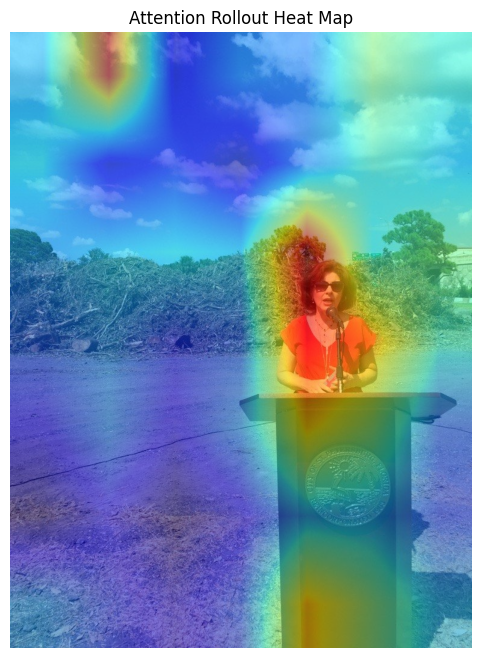

Visualizing attention for false negative image: data_image/mexico_earthquake/3_10_2017/915218535722504193_0.jpg


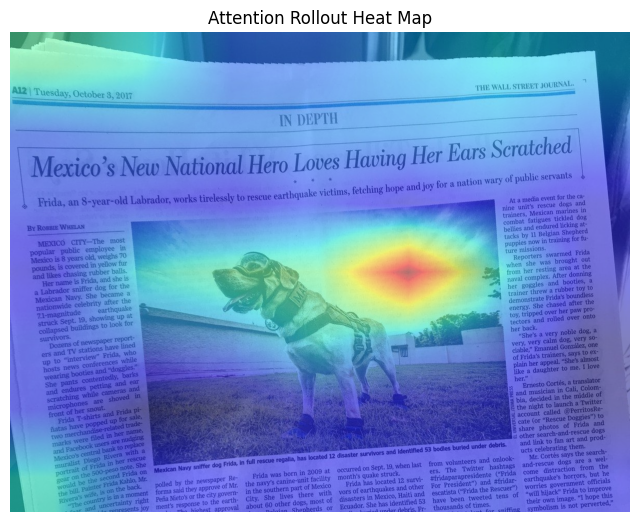

Visualizing attention for false negative image: data_image/mexico_earthquake/29_9_2017/913815929552809985_0.jpg


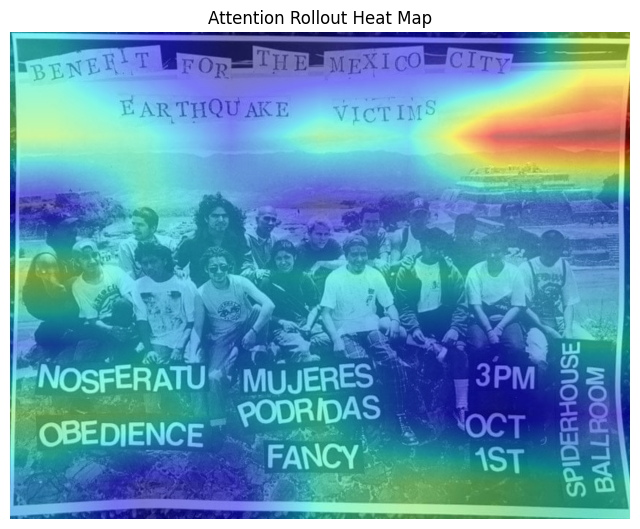

Visualizing attention for false negative image: data_image/hurricane_irma/17_9_2017/909437172599726080_0.jpg


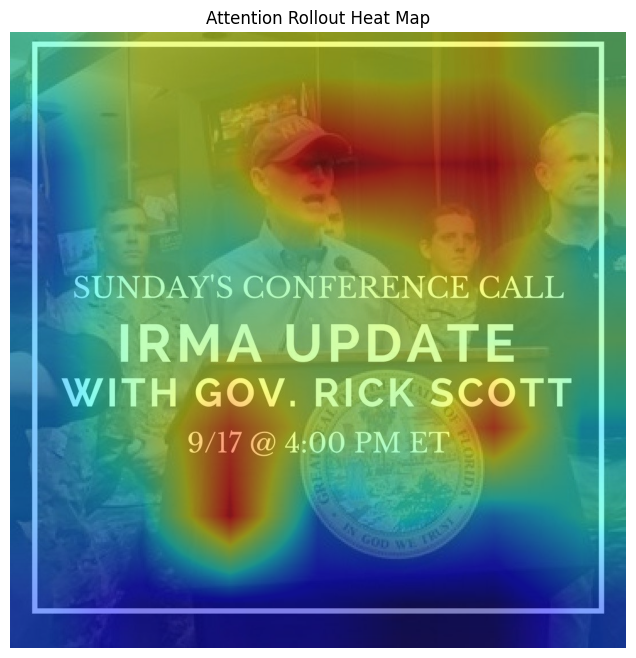

Visualizing attention for false negative image: data_image/hurricane_irma/17_9_2017/909383530148503554_0.jpg


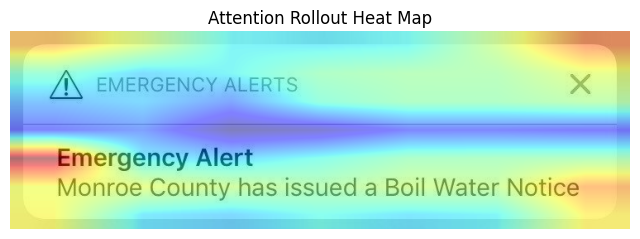

Visualizing attention for false negative image: data_image/hurricane_irma/19_9_2017/909949690552180736_0.png


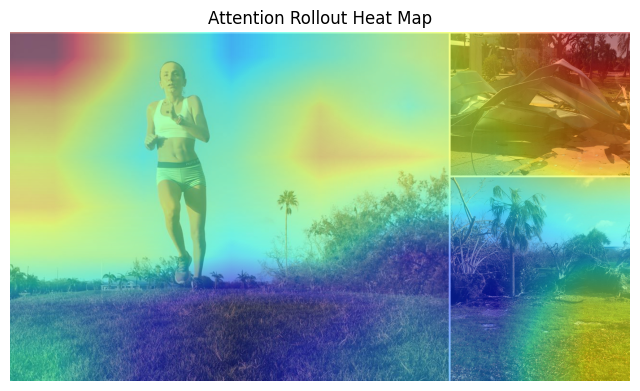

Visualizing attention for false negative image: data_image/hurricane_irma/18_9_2017/909783665533702144_0.jpg


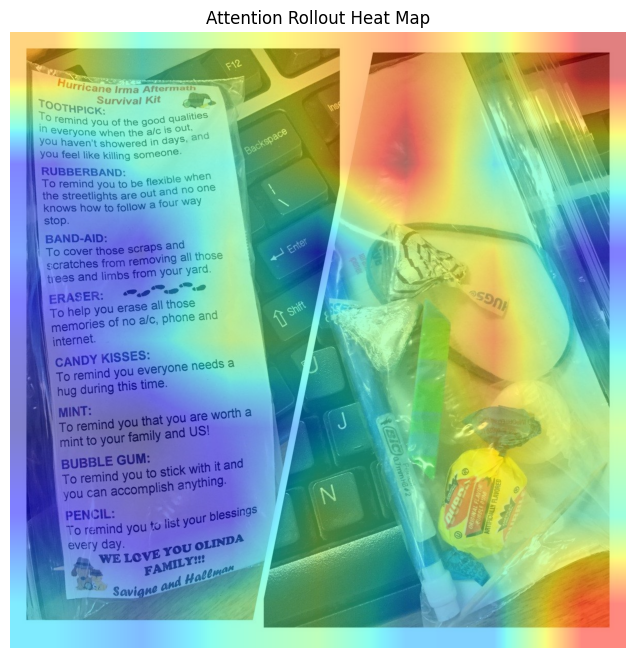

Visualizing attention for false negative image: data_image/hurricane_irma/17_9_2017/909409112638726144_0.jpg


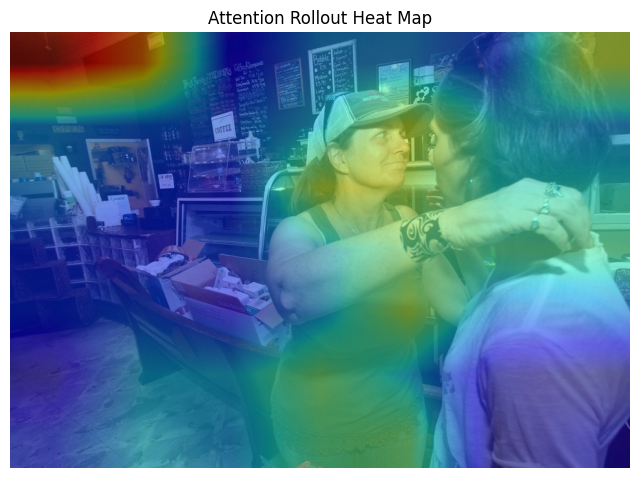

Visualizing attention for false negative image: data_image/iraq_iran_earthquake/13_11_2017/930010041134002176_0.jpg


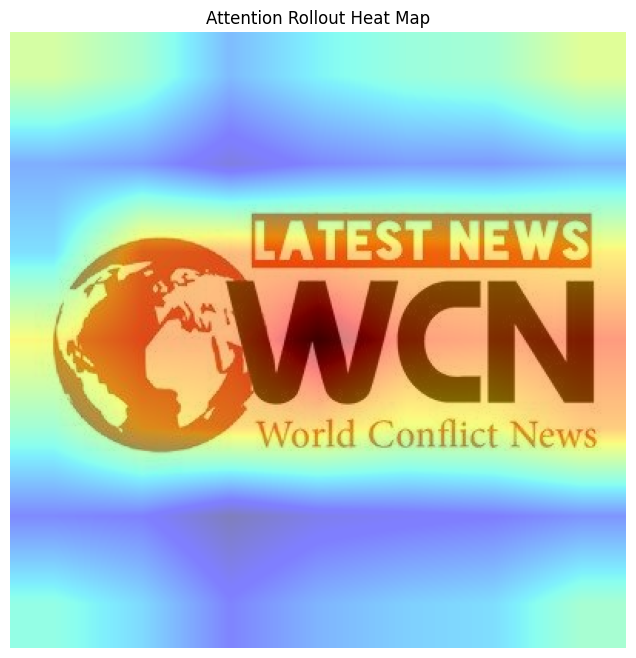

Visualizing attention for false negative image: data_image/hurricane_maria/26_10_2017/923343948491493376_0.jpg


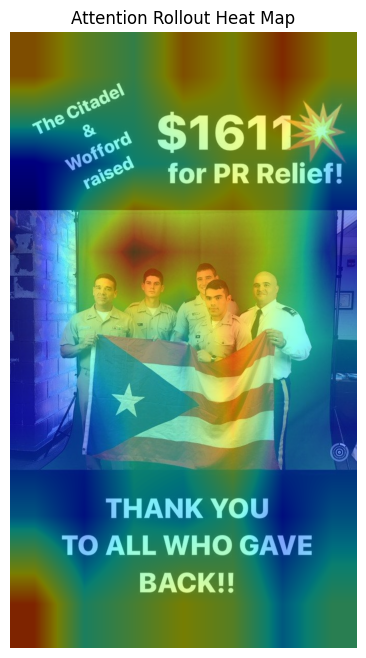

Visualizing attention for false negative image: data_image/hurricane_maria/26_10_2017/923642736300961799_0.jpg


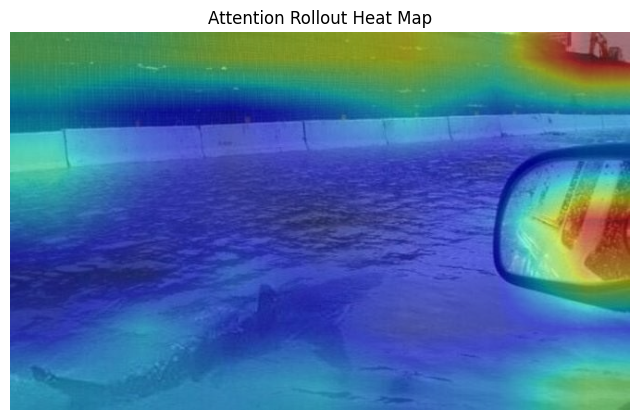

Visualizing attention for false negative image: data_image/hurricane_maria/26_10_2017/923529916913631232_0.jpg


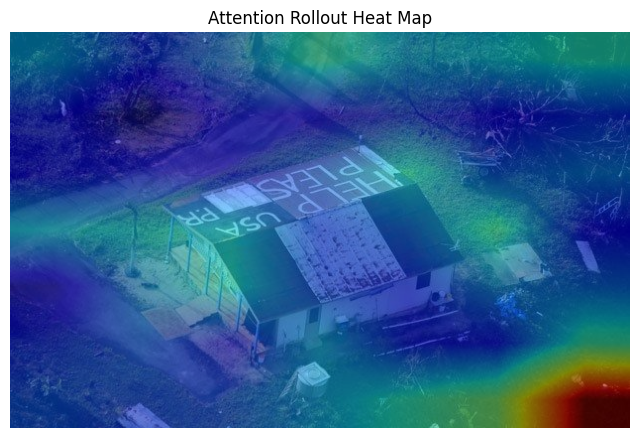

Visualizing attention for false negative image: data_image/hurricane_maria/28_9_2017/913318186942128129_0.jpg


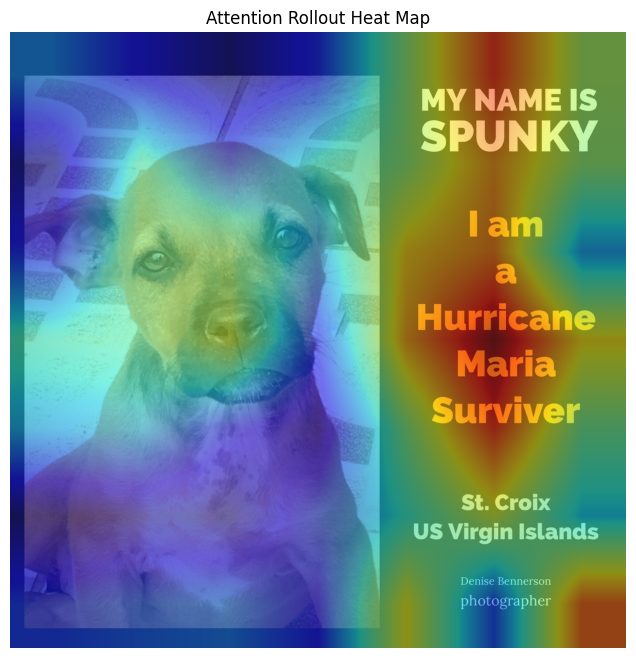

Visualizing attention for false negative image: data_image/california_wildfires/22_10_2017/921990361140080640_0.jpg


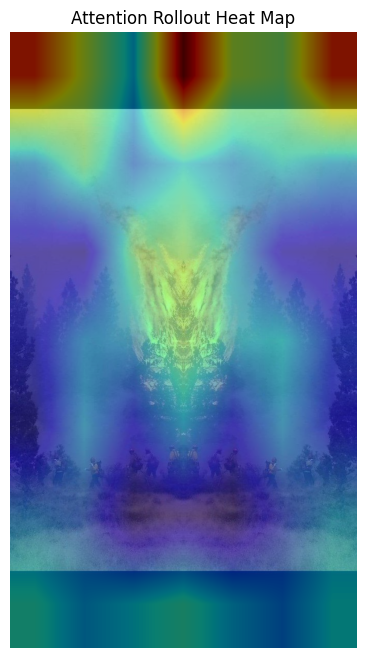

Visualizing attention for false negative image: data_image/hurricane_irma/19_9_2017/910204849765195779_1.jpg


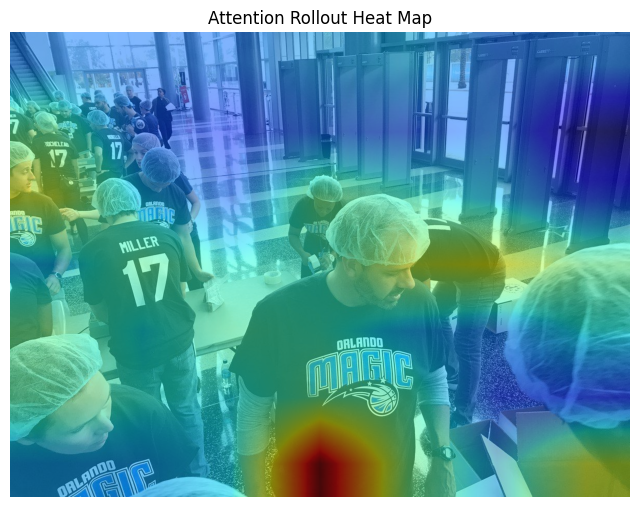

Visualizing attention for false negative image: data_image/hurricane_maria/25_10_2017/923318246488539136_1.jpg


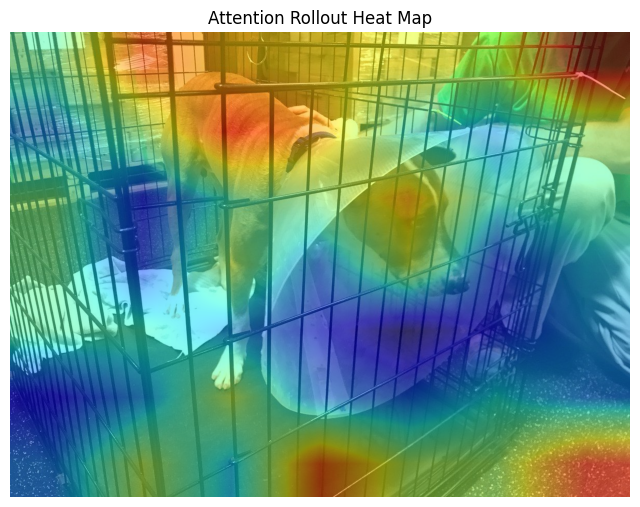

Visualizing attention for false negative image: data_image/hurricane_maria/20_10_2017/921322602693525506_0.jpg


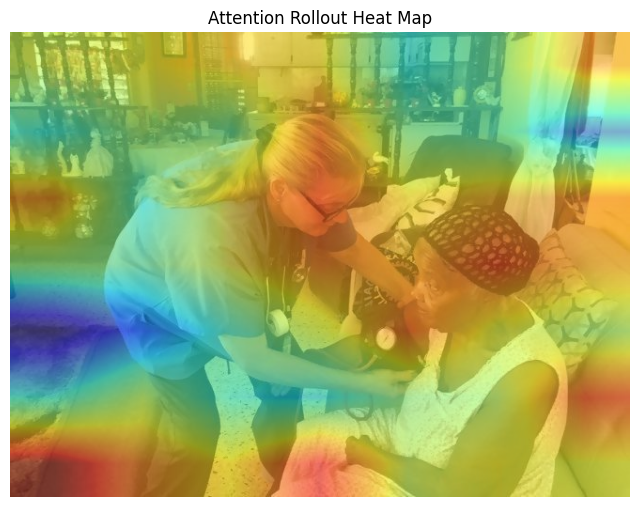

Visualizing attention for false negative image: data_image/hurricane_maria/20_10_2017/921450600474087424_0.jpg


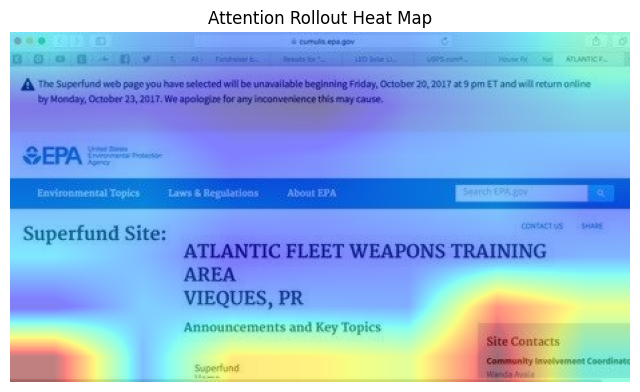

Visualizing attention for false negative image: data_image/mexico_earthquake/20_9_2017/910635936396046337_0.jpg


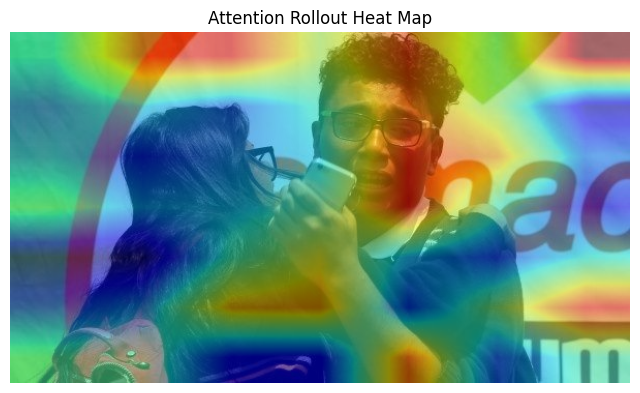

Visualizing attention for false negative image: data_image/hurricane_irma/19_9_2017/909946096197292032_0.jpg


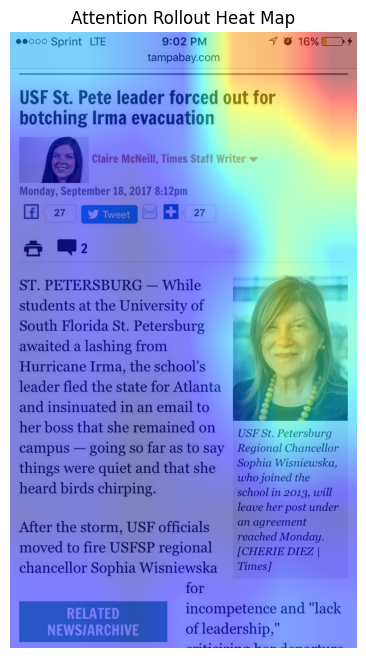

Visualizing attention for false negative image: data_image/iraq_iran_earthquake/13_11_2017/930023306002096130_0.jpg


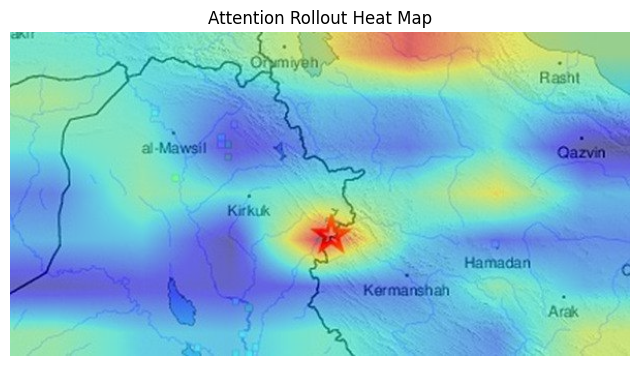

Visualizing attention for false negative image: data_image/srilanka_floods/21_6_2017/877532804472549377_0.jpg


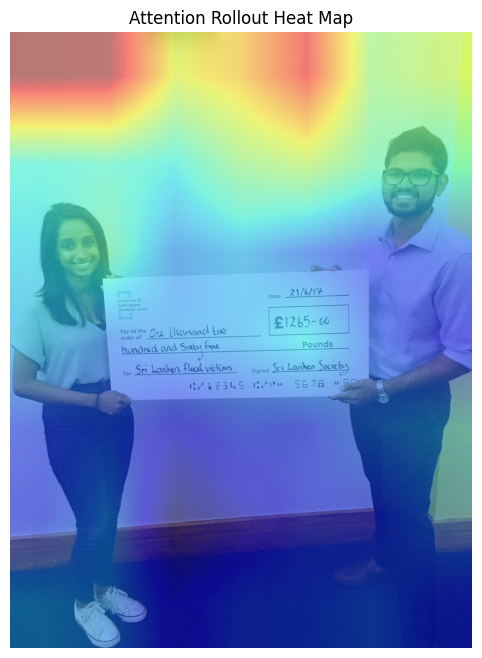

Visualizing attention for false negative image: data_image/hurricane_harvey/17_9_2017/909220520461180928_0.jpg


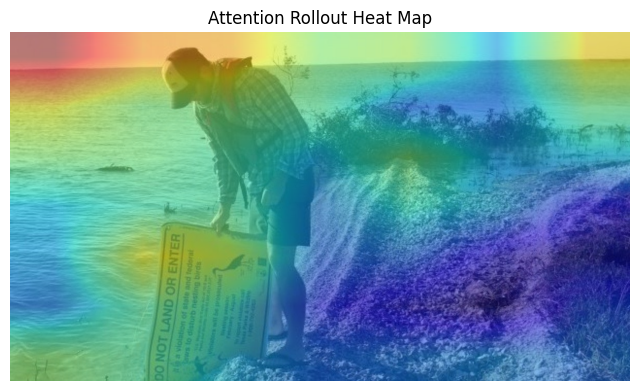

Visualizing attention for false negative image: data_image/hurricane_irma/17_9_2017/909399115443900417_0.jpg


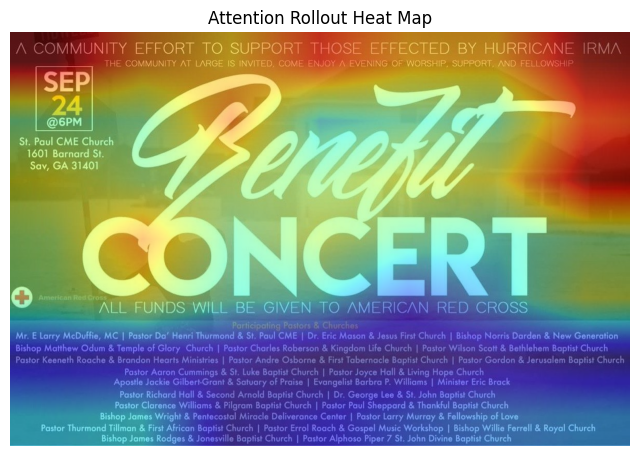

Visualizing attention for false negative image: data_image/hurricane_maria/28_9_2017/913295028671385600_0.jpg


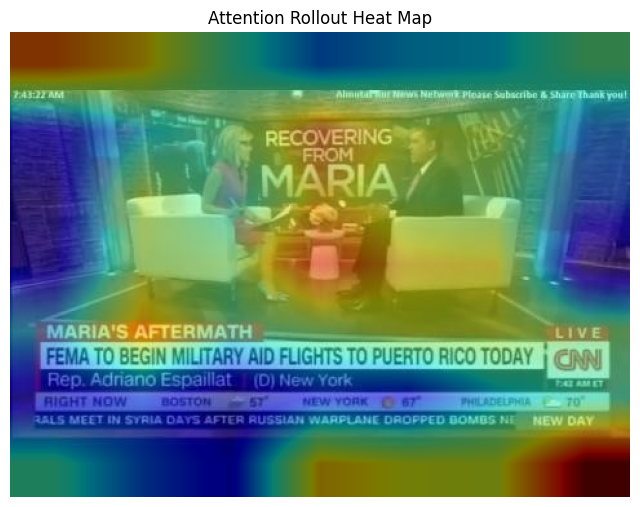

Visualizing attention for false negative image: data_image/hurricane_irma/18_9_2017/909809979338760192_0.jpg


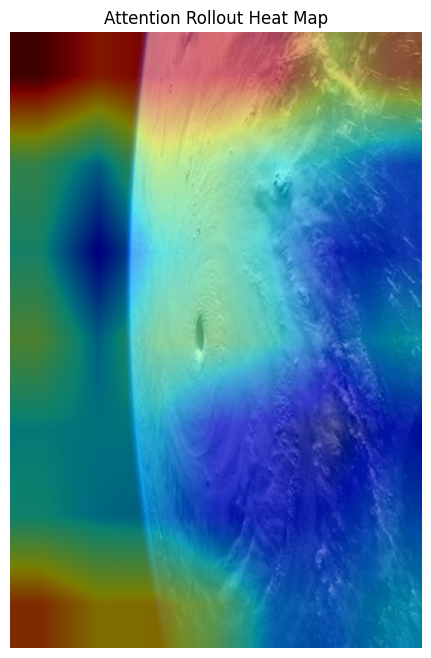

Visualizing attention for false negative image: data_image/hurricane_maria/29_9_2017/913795809803505665_0.jpg


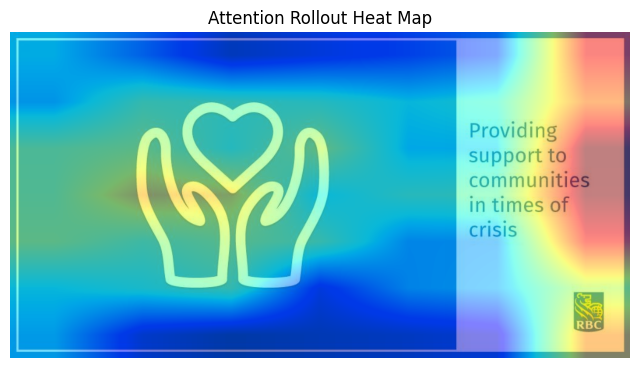

Visualizing attention for false negative image: data_image/mexico_earthquake/29_9_2017/913751945554296832_0.jpg


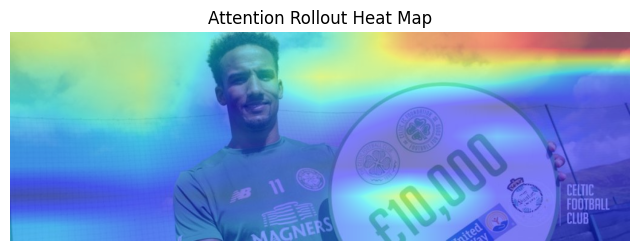

Visualizing attention for false negative image: data_image/hurricane_irma/17_9_2017/909446860938534914_0.jpg


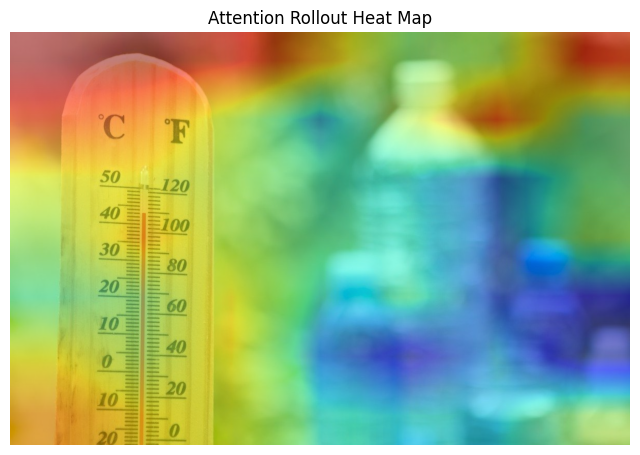

Visualizing attention for false negative image: data_image/hurricane_maria/3_10_2017/915319846849728512_0.jpg


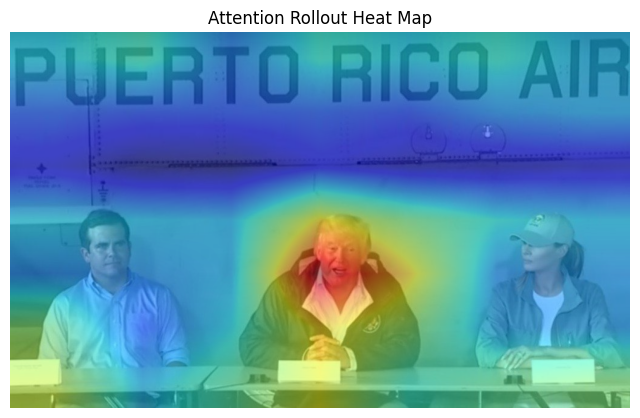

Visualizing attention for false negative image: data_image/hurricane_maria/8_11_2017/928088811497803778_0.jpg


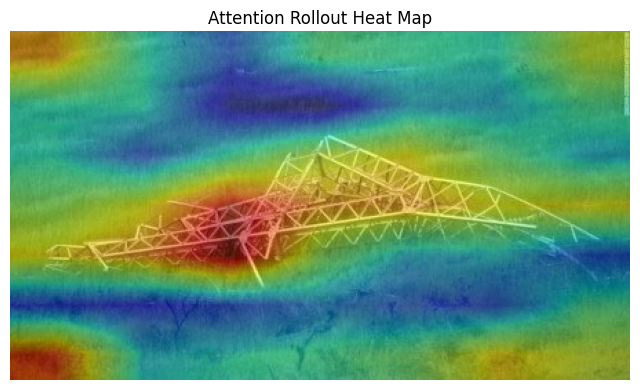

Visualizing attention for false negative image: data_image/mexico_earthquake/24_9_2017/911842861695602693_0.jpg


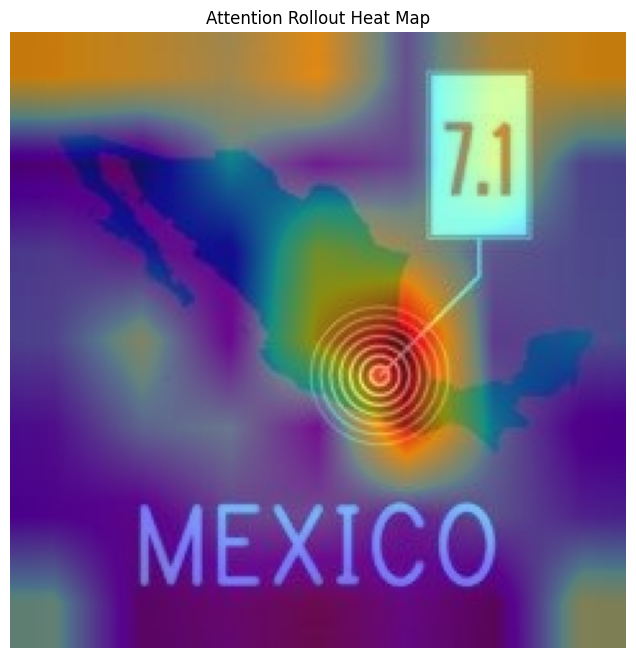

Visualizing attention for false negative image: data_image/hurricane_irma/19_9_2017/910053306566942720_0.jpg


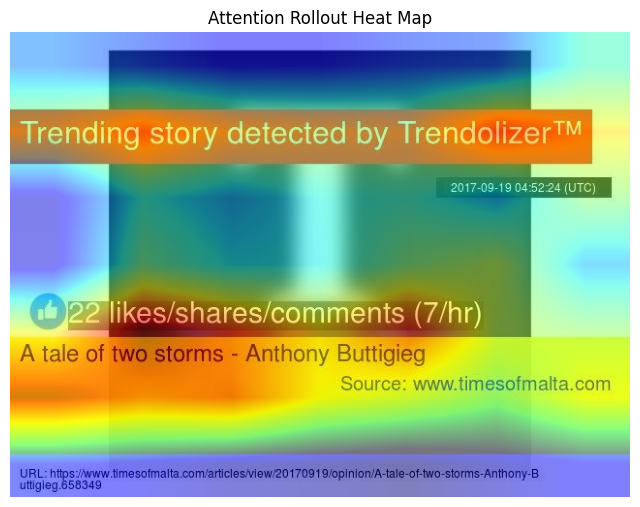

Visualizing attention for false negative image: data_image/mexico_earthquake/23_9_2017/911662909779931136_0.jpg


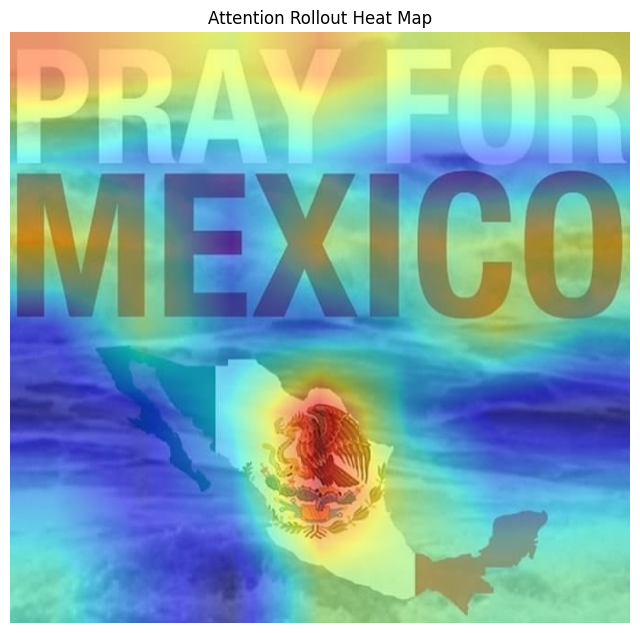

Visualizing attention for false negative image: data_image/mexico_earthquake/23_9_2017/911673144527790090_0.jpg


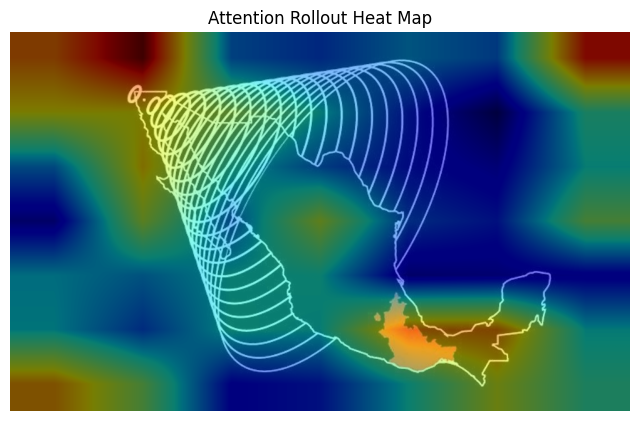

Visualizing attention for false negative image: data_image/hurricane_maria/22_10_2017/922153859354677254_0.jpg


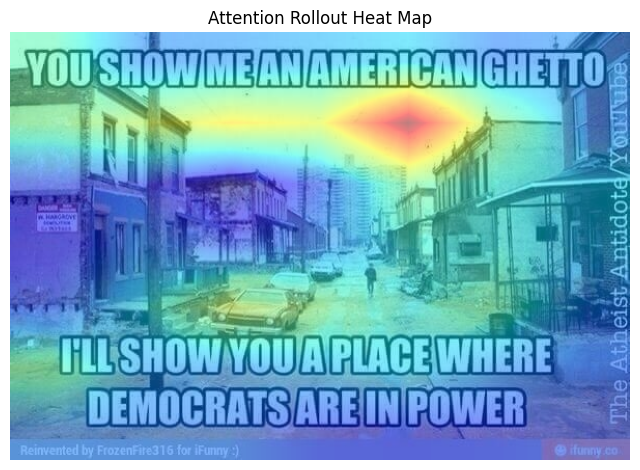

In [7]:
import torch
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import pandas as pd
from transformers import CLIPProcessor, CLIPModel

# Device configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load CLIP model and processor
processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")
clip_model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
clip_model.to(device)
clip_model.eval()  # Set model to evaluation mode

def get_rollout_attention(pixel_values):
    """
    Compute the attention rollout over all transformer layers in the CLIP vision encoder.
    This function collects attention weights from each transformer layer, averages over heads,
    adds an identity matrix for the residual connection, normalizes the rows, and then
    multiplies the matrices together.
    """
    attentions = []
    handles = []
    
    # Define a hook to capture attention weights from each layer.
    def hook_fn(module, input, output):
        # output is a tuple; second element should be the attention weights.
        if isinstance(output, tuple) and output[1] is not None:
            attentions.append(output[1].detach())
    
    # Register hooks on every transformer layer's self-attention module.
    for layer in clip_model.vision_model.encoder.layers:
        handle = layer.self_attn.register_forward_hook(hook_fn)
        handles.append(handle)
    
    # Forward pass through the vision model with output_attentions enabled.
    with torch.no_grad():
        _ = clip_model.vision_model(pixel_values, output_attentions=True)
    
    # Remove hooks.
    for h in handles:
        h.remove()
    
    # Check if we collected any attentions.
    if not attentions:
        print("No attention weights were captured.")
        return None

    # Compute rollout: for each layer, average over heads, add identity, normalize rows, and multiply.
    rollout = None
    for att in attentions:
        # Remove batch dimension: shape becomes [num_heads, tokens, tokens]
        att = att.squeeze(0)
        # Average across heads: shape [tokens, tokens]
        att_mean = att.mean(dim=0)
        # Add identity matrix to account for the residual connection.
        att_residual = att_mean + torch.eye(att_mean.size(0)).to(att_mean.device)
        # Normalize rows.
        att_normalized = att_residual / att_residual.sum(dim=-1, keepdim=True)
        # Multiply matrices across layers.
        if rollout is None:
            rollout = att_normalized
        else:
            rollout = torch.matmul(att_normalized, rollout)
    return rollout  # shape: [tokens, tokens]

def visualize_attention_rollout(image_path):
    """
    Loads an image, computes the attention rollout, extracts the attention from the CLS token 
    to all patch tokens, reshapes it into a 2D grid, and overlays the heat map on the image.
    """
    try:
        image = Image.open(image_path).convert("RGB")
    except Exception as e:
        print(f"Error loading image {image_path}: {e}")
        return

    # Preprocess the image for CLIP.
    inputs = processor(images=image, return_tensors="pt")
    pixel_values = inputs["pixel_values"].to(device)

    # Compute the attention rollout.
    rollout_attn = get_rollout_attention(pixel_values)
    if rollout_attn is None:
        print("Rollout attention could not be computed for:", image_path)
        return

    # For CLIP, the first token is the CLS token.
    cls_attention = rollout_attn[0, 1:]  # Exclude the CLS token itself.
    
    # Determine grid size. For CLIP-ViT, tokens-1 is typically 49 (i.e., a 7x7 grid).
    num_patches = cls_attention.shape[0]
    grid_size = int(np.sqrt(num_patches))
    if grid_size * grid_size != num_patches:
        print("Unexpected number of patch tokens for:", image_path)
        return
    
    # Reshape to 2D grid.
    attn_map = cls_attention.reshape(grid_size, grid_size).cpu().numpy()
    # Upsample the attention map to match the original image size.
    attn_map_resized = cv2.resize(attn_map, image.size)  # image.size returns (width, height)
    # Normalize the attention map between 0 and 1.
    attn_map_norm = (attn_map_resized - attn_map_resized.min()) / (attn_map_resized.max() - attn_map_resized.min())

    # Overlay the heat map on the original image.
    plt.figure(figsize=(8, 8))
    plt.imshow(image)
    plt.imshow(attn_map_norm, cmap="jet", alpha=0.5)
    plt.axis("off")
    plt.title("Attention Rollout Heat Map")
    plt.show()

# Load the false negatives CSV file.
false_negatives_csv = r"D:\BTP_2\CrisisMMD_v2.0\false_negatives.csv"
false_negatives_df = pd.read_csv(false_negatives_csv)

# Loop over each false negative image and visualize its attention rollout heat map.
for idx, row in false_negatives_df.iterrows():
    image_path = row["image_path"]
    print(f"Visualizing attention for false negative image: {image_path}")
    visualize_attention_rollout(image_path)
